Paramters: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html

# perplexityfloat, default=30.0. The perplexity is related to the number of nearest neighbors that is used in other manifold learning algorithms. Larger datasets usually require a larger perplexity. Consider selecting a value between 5 and 50.

In [1]:
# Data manipulation
import pandas as pd # for data manipulation

# Visualization
import plotly.express as px # for data visualization
import matplotlib.pyplot as plt # for showing handwritten digits

# Skleran
from sklearn.datasets import load_digits # for MNIST data
from sklearn.manifold import TSNE # for t-SNE dimensionality reduction

In [2]:
# Load digits data 
digits = load_digits()

# Load arrays containing digit data (64 pixels per image) and their true labels
X, y = load_digits(return_X_y=True)

# Some stats
print('Shape of digit images: ', digits.images.shape)
print('Shape of X (training data): ', X.shape)
print('Shape of y (true labels): ', y.shape)

Shape of digit images:  (1797, 8, 8)
Shape of X (training data):  (1797, 64)
Shape of y (true labels):  (1797,)


when you input two for loops toghether. In this case the first one, starts in 0 and goes to the second for all the values from 0 to 5.
The 1 does the same goes from 0 to 5 and so on...

In [3]:
y

array([0, 1, 2, ..., 8, 9, 8])

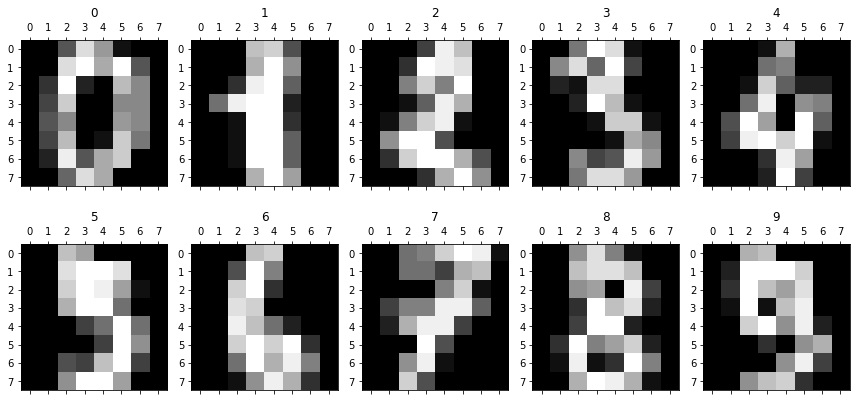

In [4]:
# Display images of the first 10 digits
fig, axs = plt.subplots(2, 5, sharey=False, tight_layout=True, figsize=(12,6), facecolor='white')
n=0
plt.gray() 
for i in range(0,2):
    for j in range(0,5):
        axs[i,j].matshow(digits.images[n])
        axs[i,j].set(title=y[n])
        n=n+1
plt.show() 

Applying t-SNE to our data
In the previous step, we loaded data into an array X of the shape (1797,64), which means that we have 1,797 digits, each made up of 64 dimensions.

The most important components are n_components(dimensions) and perplexity(number of neighours)

In [5]:
# Configure t-SNE function. 
embed = TSNE(
    n_components=2, # default=2, Dimension of the embedded space.
    perplexity=10, # default=30.0, The perplexity is related to the number of nearest neighbors that is used in other manifold learning algorithms.
    early_exaggeration=12, # default=12.0, Controls how tight natural clusters in the original space are in the embedded space and how much space will be between them. 
    learning_rate=200, # default=200.0, The learning rate for t-SNE is usually in the range [10.0, 1000.0]. If the learning rate is too high, the data may look like a ‘ball’ with any point approximately equidistant from its nearest neighbours. If the learning rate is too low, most points may look compressed in a dense cloud with few outliers.
    n_iter=5000, # default=1000, Maximum number of iterations for the optimization. Should be at least 250.
    n_iter_without_progress=300, # default=300, Maximum number of iterations without progress before we abort the optimization, used after 250 initial iterations with early exaggeration. 
    min_grad_norm=0.0000001, # default=1e-7, If the gradient norm is below this threshold, the optimization will be stopped.
    metric='euclidean', # default=’euclidean’, The metric to use when calculating distance between instances in a feature array.
    init='random', # {‘random’, ‘pca’} or ndarray of shape (n_samples, n_components), default=’random’. Initialization of embedding
    verbose=0, # default=0, Verbosity level.
    random_state=42, # RandomState instance or None, default=None. Determines the random number generator. Pass an int for reproducible results across multiple function calls.
    method='barnes_hut', # default=’barnes_hut’. By default the gradient calculation algorithm uses Barnes-Hut approximation running in O(NlogN) time. method=’exact’ will run on the slower, but exact, algorithm in O(N^2) time. The exact algorithm should be used when nearest-neighbor errors need to be better than 3%. 
    angle=0.5, # default=0.5, Only used if method=’barnes_hut’ This is the trade-off between speed and accuracy for Barnes-Hut T-SNE.
    n_jobs=-1, # default=None, The number of parallel jobs to run for neighbors search. -1 means using all processors. 
)

In [6]:
# Transform X
X_embedded = embed.fit_transform(X)

In [7]:
# Print results
print('New Shape of X: ', X_embedded.shape)
print('Kullback-Leibler divergence after optimization: ', embed.kl_divergence_)
print('No. of iterations: ', embed.n_iter_)
#print('Embedding vectors: ', embed.embedding_)

New Shape of X:  (1797, 2)
Kullback-Leibler divergence after optimization:  0.8352904319763184
No. of iterations:  4999


In [8]:

# Create a scatter plot
fig = px.scatter(None, x=X_embedded[:,0], y=X_embedded[:,1], 
                 labels={
                     "x": "Dimension 1",
                     "y": "Dimension 2",
                 },
                 opacity=1, color=y.astype(str))

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Set figure title
fig.update_layout(title_text="t-SNE")

# Update marker size
fig.update_traces(marker=dict(size=3))

fig.show()

Really good spread of the groups, separated. 

In [9]:
# Configure t-SNE function. 
embed_3 = TSNE(
    n_components=3, # default=2, Dimension of the embedded space.
    perplexity=10, # default=30.0, The perplexity is related to the number of nearest neighbors that is used in other manifold learning algorithms.
    early_exaggeration=12, # default=12.0, Controls how tight natural clusters in the original space are in the embedded space and how much space will be between them. 
    learning_rate=200, # default=200.0, The learning rate for t-SNE is usually in the range [10.0, 1000.0]. If the learning rate is too high, the data may look like a ‘ball’ with any point approximately equidistant from its nearest neighbours. If the learning rate is too low, most points may look compressed in a dense cloud with few outliers.
    n_iter=5000, # default=1000, Maximum number of iterations for the optimization. Should be at least 250.
    n_iter_without_progress=300, # default=300, Maximum number of iterations without progress before we abort the optimization, used after 250 initial iterations with early exaggeration. 
    min_grad_norm=0.0000001, # default=1e-7, If the gradient norm is below this threshold, the optimization will be stopped.
    metric='euclidean', # default=’euclidean’, The metric to use when calculating distance between instances in a feature array.
    init='random', # {‘random’, ‘pca’} or ndarray of shape (n_samples, n_components), default=’random’. Initialization of embedding
    verbose=0, # default=0, Verbosity level.
    random_state=42, # RandomState instance or None, default=None. Determines the random number generator. Pass an int for reproducible results across multiple function calls.
    method='barnes_hut', # default=’barnes_hut’. By default the gradient calculation algorithm uses Barnes-Hut approximation running in O(NlogN) time. method=’exact’ will run on the slower, but exact, algorithm in O(N^2) time. The exact algorithm should be used when nearest-neighbor errors need to be better than 3%. 
    angle=0.5, # default=0.5, Only used if method=’barnes_hut’ This is the trade-off between speed and accuracy for Barnes-Hut T-SNE.
    n_jobs=-1, # default=None, The number of parallel jobs to run for neighbors search. -1 means using all processors. 
)

In [10]:
# Transform X
X_embedded = embed_3.fit_transform(X)

In [11]:
# Create a 3D scatter plot
fig = px.scatter_3d(None, 
                    x=X_embedded[:,0], y=X_embedded[:,1], z=X_embedded[:,2],
                    color=y.astype(str),
                    height=900, width=900
                   )

# Update chart looks
fig.update_layout(#title_text="Scatter 3D Plot",
                  showlegend=True,
                  legend=dict(orientation="h", yanchor="top", y=0, xanchor="center", x=0.5),
                  scene_camera=dict(up=dict(x=0, y=0, z=1), 
                                        center=dict(x=0, y=0, z=-0.2),
                                        eye=dict(x=-1.5, y=1.5, z=0.5)),
                                        margin=dict(l=0, r=0, b=0, t=0),
                  scene = dict(xaxis=dict(backgroundcolor='white',
                                          color='black',
                                          gridcolor='#f0f0f0',
                                          title_font=dict(size=10),
                                          tickfont=dict(size=10),
                                         ),
                               yaxis=dict(backgroundcolor='white',
                                          color='black',
                                          gridcolor='#f0f0f0',
                                          title_font=dict(size=10),
                                          tickfont=dict(size=10),
                                          ),
                               zaxis=dict(backgroundcolor='lightgrey',
                                          color='black', 
                                          gridcolor='#f0f0f0',
                                          title_font=dict(size=10),
                                          tickfont=dict(size=10),
                                         )))

# Update marker size
fig.update_traces(marker=dict(size=2))

fig.show()

In [15]:
# Print results
print('New Shape of X: ', X_embedded.shape)
print('Kullback-Leibler divergence after optimization: ', embed_3.kl_divergence_)
print('No. of iterations: ', embed_3 .n_iter_)
#print('Embedding vectors: ', embed.embedding_)

New Shape of X:  (1797, 3)
Kullback-Leibler divergence after optimization:  0.7142598032951355
No. of iterations:  4999


3 dimensions is even better than the previous one. giving a lower Kullback-Leibler divergence is has been minimized. 

In [16]:
df = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/Fish.csv')

In [17]:
df.head(5)

,Species,Weight,Length1,Length2,Length3,Height,Width
0,Bream,242.0,23.2,25.4,30.0,11.5200,4.0200
1,Bream,290.0,24.0,26.3,31.2,12.4800,4.3056
2,Bream,340.0,23.9,26.5,31.1,12.3778,4.6961
3,Bream,363.0,26.3,29.0,33.5,12.7300,4.4555
4,Bream,430.0,26.5,29.0,34.0,12.4440,5.1340


In [18]:
import numpy as np

In [19]:
df['sex'] = np.where(df['Height']>10, 'Male', 'Female')

In [20]:
df.head(10)

,Species,Weight,Length1,Length2,Length3,Height,Width,sex
0,Bream,242.0,23.2,25.4,30.0,11.5200,4.0200,Male
1,Bream,290.0,24.0,26.3,31.2,12.4800,4.3056,Male
2,Bream,340.0,23.9,26.5,31.1,12.3778,4.6961,Male
3,Bream,363.0,26.3,29.0,33.5,12.7300,4.4555,Male
4,Bream,430.0,26.5,29.0,34.0,12.4440,5.1340,Male
5,Bream,450.0,26.8,29.7,34.7,13.6024,4.9274,Male
6,Bream,500.0,26.8,29.7,34.5,14.1795,5.2785,Male
7,Bream,390.0,27.6,30.0,35.0,12.6700,4.6900,Male
8,Bream,450.0,27.6,30.0,35.1,14.0049,4.8438,Male
9,Bream,500.0,28.5,30.7,36.2,14.2266,4.9594,Male


In [21]:
from sklearn.preprocessing import StandardScaler

In [22]:
data_columns = ['Weight','Length1','Length2','Length3','Height','Width']

In [23]:
#scaling the data from 0 to 1. 
std_scaler = StandardScaler()
df[data_columns] = std_scaler.fit_transform(df[data_columns])

In [24]:
df.shape

(159, 8)

In [25]:
from sklearn.manifold import TSNE # for t-SNE dimensionality reduction

In [26]:
# Configure t-SNE function. 
TSNE = TSNE(
    n_components=3, # default=2, Dimension of the embedded space.
    perplexity=10, # default=30.0, The perplexity is related to the number of nearest neighbors that is used in other manifold learning algorithms.
    early_exaggeration=12, # default=12.0, Controls how tight natural clusters in the original space are in the embedded space and how much space will be between them. 
    learning_rate=200, # default=200.0, The learning rate for t-SNE is usually in the range [10.0, 1000.0]. If the learning rate is too high, the data may look like a ‘ball’ with any point approximately equidistant from its nearest neighbours. If the learning rate is too low, most points may look compressed in a dense cloud with few outliers.
    n_iter=5000, # default=1000, Maximum number of iterations for the optimization. Should be at least 250.
    n_iter_without_progress=300, # default=300, Maximum number of iterations without progress before we abort the optimization, used after 250 initial iterations with early exaggeration. 
    min_grad_norm=0.0000001, # default=1e-7, If the gradient norm is below this threshold, the optimization will be stopped.
    metric='euclidean', # default=’euclidean’, The metric to use when calculating distance between instances in a feature array.
    init='random', # {‘random’, ‘pca’} or ndarray of shape (n_samples, n_components), default=’random’. Initialization of embedding
    verbose=0, # default=0, Verbosity level.
    random_state=42, # RandomState instance or None, default=None. Determines the random number generator. Pass an int for reproducible results across multiple function calls.
    method='barnes_hut', # default=’barnes_hut’. By default the gradient calculation algorithm uses Barnes-Hut approximation running in O(NlogN) time. method=’exact’ will run on the slower, but exact, algorithm in O(N^2) time. The exact algorithm should be used when nearest-neighbor errors need to be better than 3%. 
    angle=0.5, # default=0.5, Only used if method=’barnes_hut’ This is the trade-off between speed and accuracy for Barnes-Hut T-SNE.
    n_jobs=-1, # default=None, The number of parallel jobs to run for neighbors search. -1 means using all processors. 
)

In [27]:
df_TSNE  = TSNE.fit_transform(df[data_columns])

In [28]:
import plotly.express as px # for data visualization

In [29]:
df_TSNE.shape

(159, 3)

In [30]:
%matplotlib inline
import matplotlib.pyplot as plt

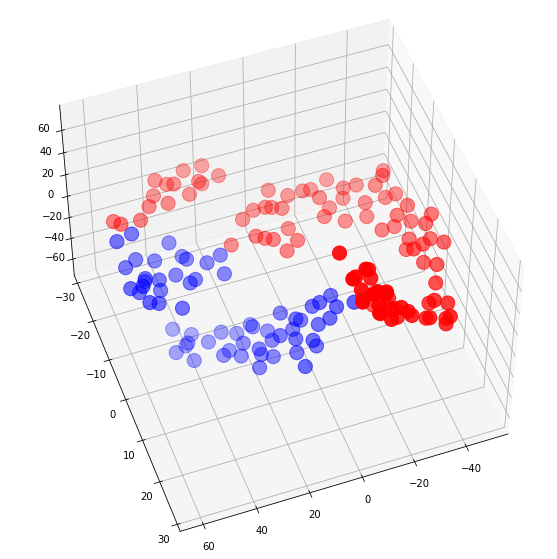

In [31]:
plt.figure(figsize=(10,10))
ax = plt.axes(projection='3d')
colors_fish = {'Male': 'b','Female':'r'}
ax.scatter3D(df_TSNE[:,0],df_TSNE[:,1],df_TSNE[:,2],c= df['sex'].apply(lambda x:colors_fish[x]),s=200)
ax.view_init(azim=70, elev=50)

In [32]:
df[['TSNE1','TSNE2','TSNE3']] = df_TSNE

In [33]:
fig = px.scatter_3d(df,x='TSNE1',y='TSNE2',z='TSNE3',color='sex')
fig.show()

In [35]:
df.head(5)

,Species,Weight,Length1,Length2,Length3,Height,Width,sex,TSNE1,TSNE2,TSNE3
0,Bream,-0.438072,-0.305789,-0.282303,-0.106020,0.596579,-0.236529,Male,-6.542594,5.572919,-6.853700
1,Bream,-0.303562,-0.225507,-0.198054,-0.002337,0.821261,-0.066579,Male,-3.171291,9.791933,-10.006939
2,Bream,-0.163448,-0.235542,-0.179332,-0.010977,0.797341,0.165793,Male,0.669814,5.852483,-10.993358
3,Bream,-0.098995,0.005302,0.054694,0.196390,0.879771,0.022621,Male,0.513837,8.865352,-16.920708
4,Bream,0.088759,0.025372,0.054694,0.239592,0.812835,0.426371,Male,7.009461,6.041021,-17.892857


In [37]:
df['Species'].value_counts()

Perch        56
Bream        35
Roach        20
Pike         17
Smelt        14
Parkki       11
Whitefish     6
Name: Species, dtype: int64

In [38]:
fig = px.scatter_3d(df,x='TSNE1',y='TSNE1',z='TSNE1',color='Species')
fig.show()

In [42]:
# replacing values
df['Species_numbers'] = df['Species'].replace(['Perch','Bream','Roach','Pike','Smelt','Parkki','Whitefish'],
                        [0,1,2,3,4,5,6], inplace=True)

In [45]:
from sklearn.preprocessing import LabelEncoder

In [46]:
# creating instance of labelencoder
labelencoder = LabelEncoder()

In [48]:
# Assigning numerical values and storing in another column
df['Species_numbers_LE']  = labelencoder.fit_transform(df['Species'])
df['Species_numbers_LE'] 

0      1
1      1
2      1
3      1
4      1
      ..
154    4
155    4
156    4
157    4
158    4
Name: Species_numbers_LE, Length: 159, dtype: int64

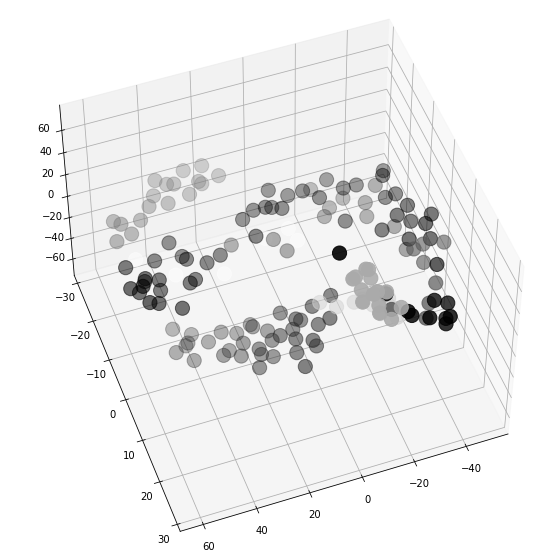

In [49]:
plt.figure(figsize=(10,10))
ax = plt.axes(projection='3d')
ax.scatter3D(df_TSNE[:,0],df_TSNE[:,1],df_TSNE[:,2],c= df['Species_numbers_LE'] ,s=200)
ax.view_init(azim=70, elev=50)

In [12]:
df = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/Unsupervised learning/Dimensionality reduction/Food.csv')

In [13]:
df.head(5)

,product,brand,type,size,organic
0,p1,A,diet,5,0
1,p2,C,diet,8,0
2,p3,D,salty,25,1
3,p4,E,candy,8,0
4,p5,B,diet,6,0


In [14]:
# Data
X = pd.get_dummies(df.drop(['product'], axis=1))

In [15]:
X

,size,organic,brand_A,brand_B,brand_C,brand_D,brand_E,type_candy,type_diet,type_salty
0,5,0,1,0,0,0,0,0,1,0
1,8,0,0,0,1,0,0,0,1,0
2,25,1,0,0,0,1,0,0,0,1
3,8,0,0,0,0,0,1,1,0,0
4,6,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...
145,15,1,0,1,0,0,0,1,0,0
146,5,0,0,0,0,1,0,1,0,0
147,8,0,0,0,1,0,0,0,1,0
148,5,1,0,0,1,0,0,1,0,0


In [59]:
from sklearn.manifold import TSNE # for t-SNE dimensionality reduction

# Parameter Optimization of perplexity. 

In [16]:
# Loop
for i, p in enumerate( [5, 10, 15, 20, 30, 100] ):
  # Run t-SNE
  t_sne = TSNE(n_components=2,
              perplexity=p,
              random_state=12)

In [17]:
# Calculate Matrix
matrix_fit = t_sne.fit_transform(X)

In [18]:
matrix_fit.shape

(150, 2)

In [19]:
import seaborn as sns

In [20]:
n_components = 2

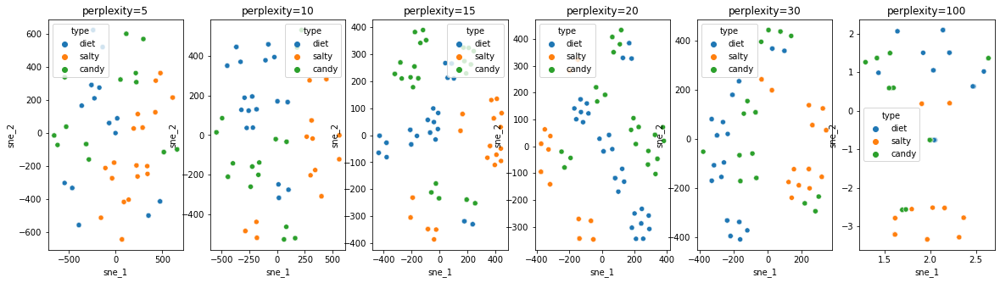

In [24]:
# Setup grid
fig, ax = plt.subplots(1,6, figsize=(20,5))

# Loop
for i, p in enumerate( [5, 10, 15, 20, 30, 100] ):
  # Run t-SNE
    t_sne = TSNE(n_components=n_components,
              perplexity=p,
              random_state=12)
  
  # Calculate Matrix
    matrix_fit = t_sne.fit_transform(X)

  # Gather products and SNE transformation
    df['sne_1'] = matrix_fit[:,0]
    df['sne_2'] = matrix_fit[:,1]
    g = sns.scatterplot(data=df, x='sne_1', y='sne_2', hue='type', ax=ax[i])
    g.set_title(f'perplexity={p}');

# You must find the fine tune of the perplexity and n_iter hyperparameters to be able to get the best separation and similarities for your data. Try using loop and plot for best results.

# T-SNE is for dimensionalty reduction but it is good to check visualization to check how well the data has being separated. 

K Means

In [25]:
# Kmeans
from sklearn.cluster import KMeans

In [26]:
# Run Kmeans using t-SNE output
cluster = KMeans(n_clusters=5)

# Fit kmeans
clusters1 = cluster.fit_predict(X)

# Result
result_cluster1 = df
result_cluster1['cluster'] = clusters1
result_cluster1.head(3)

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



,product,brand,type,size,organic,sne_1,sne_2,cluster
0,p1,A,diet,5,0,1.923547,1.502240,2
1,p2,C,diet,8,0,2.465462,0.630807,1
2,p3,D,salty,25,1,1.799332,-2.553308,4


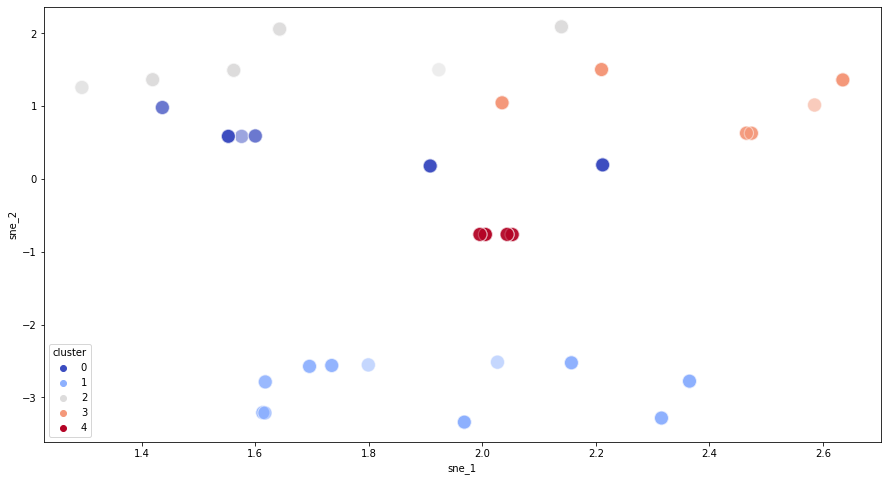

In [39]:
# Plot custers scatterplot
plt.figure(figsize=(15,8))
fig = sns.scatterplot(x='sne_1', y='sne_2', hue='cluster', 
                      alpha=0.5, s=200, palette='coolwarm',
                      data=result_cluster1)

K Means using low dimensional Data

In [28]:
matrix_fit.shape

(150, 2)

In [29]:
# Run Kmeans using t-SNE output
cluster = KMeans(n_clusters=5)

# Fit kmeans
clusters = cluster.fit_predict(matrix_fit)

# Result
result_cluster = df
result_cluster['cluster'] = clusters
result_cluster.head(3)

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



,product,brand,type,size,organic,sne_1,sne_2,cluster
0,p1,A,diet,5,0,1.923547,1.502240,2
1,p2,C,diet,8,0,2.465462,0.630807,3
2,p3,D,salty,25,1,1.799332,-2.553308,1


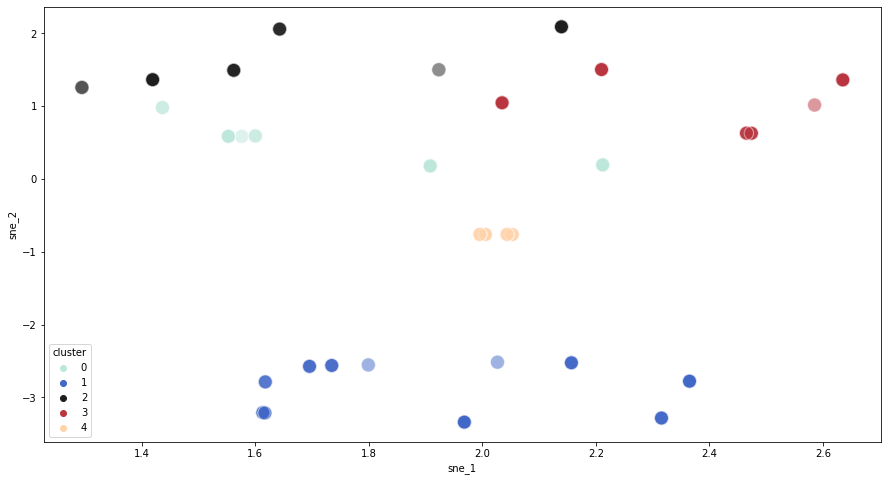

In [30]:
# Plot custers scatterplot
plt.figure(figsize=(15,8))
fig = sns.scatterplot(x='sne_1', y='sne_2', hue='cluster', alpha=0.5, s=200, palette='icefire',
           data=result_cluster)

In [31]:
# Run Kmeans using t-SNE output
cluster = KMeans(n_clusters=2)

# Fit kmeans
clusters_2 = cluster.fit_predict(matrix_fit)

# Result
result_cluster = df
result_cluster['cluster_2'] = clusters_2
result_cluster.head(3)

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



,product,brand,type,size,organic,sne_1,sne_2,cluster,cluster_2
0,p1,A,diet,5,0,1.923547,1.502240,2,1
1,p2,C,diet,8,0,2.465462,0.630807,3,1
2,p3,D,salty,25,1,1.799332,-2.553308,1,0


# Two clusters seems to be the best spearation

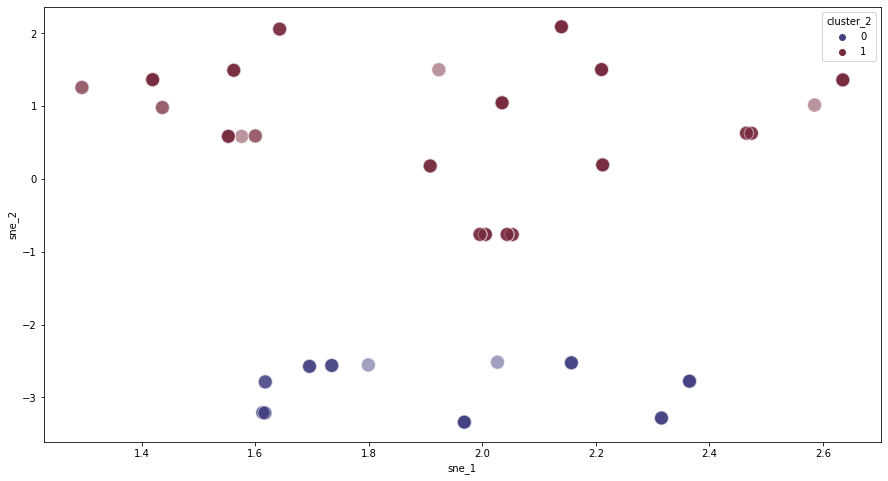

In [32]:
# Plot custers scatterplot
plt.figure(figsize=(15,8))
fig = sns.scatterplot(x='sne_1', y='sne_2', hue='cluster_2', alpha=0.5, s=200, palette='icefire',
           data=result_cluster)

2 clusters division is better than more. 

In [88]:
from sklearn.datasets import load_digits
X, y = load_digits(return_X_y=True)

In [89]:
# Configure t-SNE function. 
TSNE_digits = TSNE(
    n_components=2, # default=2, Dimension of the embedded space.
    perplexity=40, # default=30.0, The perplexity is related to the number of nearest neighbors that is used in other manifold learning algorithms.
    early_exaggeration=12, # default=12.0, Controls how tight natural clusters in the original space are in the embedded space and how much space will be between them. 
    learning_rate=200, # default=200.0, The learning rate for t-SNE is usually in the range [10.0, 1000.0]. If the learning rate is too high, the data may look like a ‘ball’ with any point approximately equidistant from its nearest neighbours. If the learning rate is too low, most points may look compressed in a dense cloud with few outliers.
    n_iter=1000, # default=1000, Maximum number of iterations for the optimization. Should be at least 250.
    n_iter_without_progress=300, # default=300, Maximum number of iterations without progress before we abort the optimization, used after 250 initial iterations with early exaggeration. 
    min_grad_norm=0.0000001, # default=1e-7, If the gradient norm is below this threshold, the optimization will be stopped.
    metric='euclidean', # default=’euclidean’, The metric to use when calculating distance between instances in a feature array.
    init='random', # {‘random’, ‘pca’} or ndarray of shape (n_samples, n_components), default=’random’. Initialization of embedding
    verbose=0, # default=0, Verbosity level.
    random_state=42, # RandomState instance or None, default=None. Determines the random number generator. Pass an int for reproducible results across multiple function calls.
    method='barnes_hut', # default=’barnes_hut’. By default the gradient calculation algorithm uses Barnes-Hut approximation running in O(NlogN) time. method=’exact’ will run on the slower, but exact, algorithm in O(N^2) time. The exact algorithm should be used when nearest-neighbor errors need to be better than 3%. 
    angle=0.5, # default=0.5, Only used if method=’barnes_hut’ This is the trade-off between speed and accuracy for Barnes-Hut T-SNE.
    n_jobs=-1, # default=None, The number of parallel jobs to run for neighbors search. -1 means using all processors. 
)

In [91]:
res = TSNE_digits.fit_transform(X)

In [92]:
res

array([[ 47.18558  , -22.313284 ],
       [-17.472963 ,   2.4622314],
       [ -7.3729987,  21.272963 ],
       ...,
       [ -2.3899593,  12.307652 ],
       [ 20.648624 ,   4.657631 ],
       [  1.4573771,  14.967451 ]], dtype=float32)

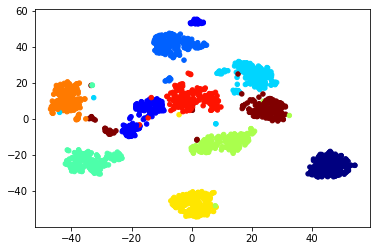

In [94]:
plt.scatter(res[:, 0], res[:, 1], s=20, c=y,cmap='jet')
plt.show()

In [105]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_wine
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

In [106]:
wine = load_wine() 
df = pd.DataFrame(wine.data, columns=wine.feature_names)

In [107]:
df

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95.0,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740.0
174,13.40,3.91,2.48,23.0,102.0,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750.0
175,13.27,4.28,2.26,20.0,120.0,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835.0
176,13.17,2.59,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840.0


In [109]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   alcohol                       178 non-null    float64
 1   malic_acid                    178 non-null    float64
 2   ash                           178 non-null    float64
 3   alcalinity_of_ash             178 non-null    float64
 4   magnesium                     178 non-null    float64
 5   total_phenols                 178 non-null    float64
 6   flavanoids                    178 non-null    float64
 7   nonflavanoid_phenols          178 non-null    float64
 8   proanthocyanins               178 non-null    float64
 9   color_intensity               178 non-null    float64
 10  hue                           178 non-null    float64
 11  od280/od315_of_diluted_wines  178 non-null    float64
 12  proline                       178 non-null    float64
dtypes: fl

Step 2: Standardizing the dataset

In [110]:
df = StandardScaler().fit_transform(df) 
df=pd.DataFrame(df,columns=wine.feature_names)

In [111]:
df.head(10)

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,1.518613,-0.562250,0.232053,-1.169593,1.913905,0.808997,1.034819,-0.659563,1.224884,0.251717,0.362177,1.847920,1.013009
1,0.246290,-0.499413,-0.827996,-2.490847,0.018145,0.568648,0.733629,-0.820719,-0.544721,-0.293321,0.406051,1.113449,0.965242
2,0.196879,0.021231,1.109334,-0.268738,0.088358,0.808997,1.215533,-0.498407,2.135968,0.269020,0.318304,0.788587,1.395148
3,1.691550,-0.346811,0.487926,-0.809251,0.930918,2.491446,1.466525,-0.981875,1.032155,1.186068,-0.427544,1.184071,2.334574
4,0.295700,0.227694,1.840403,0.451946,1.281985,0.808997,0.663351,0.226796,0.401404,-0.319276,0.362177,0.449601,-0.037874
5,1.481555,-0.517367,0.305159,-1.289707,0.860705,1.562093,1.366128,-0.176095,0.664217,0.731870,0.406051,0.336606,2.239039
6,1.716255,-0.418624,0.305159,-1.469878,-0.262708,0.328298,0.492677,-0.498407,0.681738,0.083015,0.274431,1.367689,1.729520
7,1.308617,-0.167278,0.890014,-0.569023,1.492625,0.488531,0.482637,-0.417829,-0.597284,-0.003499,0.449924,1.367689,1.745442
8,2.259772,-0.625086,-0.718336,-1.650049,-0.192495,0.808997,0.954502,-0.578985,0.681738,0.061386,0.537671,0.336606,0.949319
9,1.061565,-0.885409,-0.352802,-1.049479,-0.122282,1.097417,1.125176,-1.143031,0.453967,0.935177,0.230557,1.325316,0.949319


Note: this is not necessary, but generally preferred. As well as we explored this dataset in previous articles and found that it’s better to visualize it when it’s standardized, since many algorithms can be affected by the ranges of features being largely different from each other.

n_components : int, optional (default: 2)
This is a parameter for the dimension of the lower space to which you want to convert your dataset to. In our case the value should be 2 since we want to visualize the dataset in a 2 dimensional space.
perplexity : float, optional (default: 30)
This is a parameter for the number of nearest neighbors based on which t-SNE will determine the potential neighbors. Generally, the larger the dataset the larger should be the perplexity value. Below we will show how different perplexity values can affect the results.

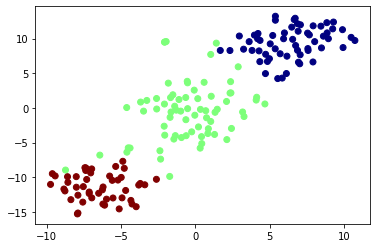

In [113]:
tsne = TSNE(random_state=0)
tsne_results = tsne.fit_transform(df) 
tsne_results=pd.DataFrame(tsne_results, columns=['tsne1', 'tsne2'])
plt.scatter(tsne_results['tsne1'], tsne_results['tsne2'], c=wine.target,cmap='jet')
plt.show()

n_componentsint, default=2
Dimension of the embedded space.

perplexityfloat, default=30.0

As we already know, t-SNE in Python comes with a set of hyperparameters that we can tune. So it doesn’t make sense for us to tune n_components since we always want to have it equal to 2 to work with a 2 dimensional space.

Let’s talk about tuning perplexity and see it’s effects on the visualized output of the transformation.

The sklearn documentation suggests considering a perplexity value between 5 and 50. Seems like this may depend on your dataset and selecting different values can produce significantly different results on a case by case basis.

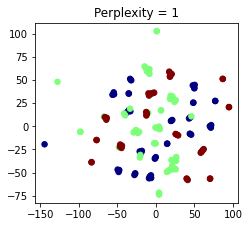

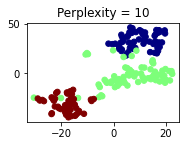

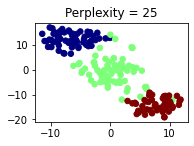

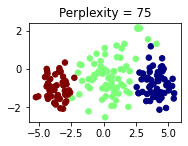

In [116]:
plt.figure(figsize = (8,4))
plt.subplots_adjust(top = 1.5) 
for index, p in enumerate([1, 10, 25, 75]):
    tsne = TSNE(n_components = 2, perplexity = p, random_state=0)
    tsne_results = tsne.fit_transform(df) 
    tsne_results=pd.DataFrame(tsne_results, columns=['tsne1', 'tsne2']) 
    plt.subplot(2,2,index+1)
    plt.scatter(tsne_results['tsne1'], tsne_results['tsne2'], c=wine.target, s=30,cmap='jet')
    plt.title('Perplexity = '+ str(p))
    plt.show()

# Perplexity 25 seems to be the best option. Data is more condensed and separated. 

In [56]:
df = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/Unsupervised learning/Dimensionality reduction/Train_Bank_dataset.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28831 entries, 0 to 28830
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             28831 non-null  int64  
 1   job             28831 non-null  object 
 2   marital         28831 non-null  object 
 3   education       28831 non-null  object 
 4   default         28831 non-null  object 
 5   housing         28831 non-null  object 
 6   loan            28831 non-null  object 
 7   contact         28831 non-null  object 
 8   month           28831 non-null  object 
 9   day_of_week     28831 non-null  object 
 10  duration        28831 non-null  int64  
 11  campaign        28831 non-null  int64  
 12  pdays           28831 non-null  int64  
 13  previous        28831 non-null  int64  
 14  poutcome        28831 non-null  object 
 15  emp.var.rate    28831 non-null  float64
 16  cons.price.idx  28831 non-null  float64
 17  cons.conf.idx   28831 non-null 

In [57]:
df.head(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,50,blue-collar,single,basic.4y,no,no,no,telephone,may,thu,...,2,999,0,nonexistent,1.1,93.994,-36.4,4.860,5191.0,no
1,51,services,married,professional.course,unknown,no,no,telephone,may,mon,...,5,999,0,nonexistent,1.1,93.994,-36.4,4.858,5191.0,no
2,46,technician,divorced,professional.course,no,yes,no,cellular,may,mon,...,2,999,0,nonexistent,-1.8,92.893,-46.2,1.244,5099.1,no
3,46,admin.,single,university.degree,no,yes,no,telephone,jun,mon,...,1,999,0,nonexistent,1.4,94.465,-41.8,4.961,5228.1,no
4,25,services,single,high.school,no,no,no,cellular,may,thu,...,5,999,0,nonexistent,-1.8,92.893,-46.2,1.266,5099.1,yes


In [179]:
df['y'].value_counts()

no     25583
yes     3248
Name: y, dtype: int64

It worth noting that the dataset contains also ‘duration’ feature (#10) which is a trap :) This feature represents the duration of the phone call after which the result (‘y’) was determined. The trap is that at the moment of prediction we don’t have this value yet. So I’ll drop this feature in every preprocessing data option. Also the dataset contains hidden missing values like “unknown” and “999”:

In [180]:
# calculating real missing data ratio considering 
# missing-like values (nan-equivalents)
def print_real_nans_ratio(df, cat_nan_equiv='unknown', num_nan_equiv=999):
    print(f'Calculating real NaNs ratio using `{str(cat_nan_equiv)}` and `{str(num_nan_equiv)}` keyvalues:')
    print('Column (value) \tNvalues \tRatio')
    print('-'*40)
    for col in df.columns:
        if df[col].dtype == 'object':
            nan_equiv = cat_nan_equiv
        else:
            nan_equiv = num_nan_equiv
        if nan_equiv in list(df[col]):
            freq_table = df[col].value_counts()
            print('{} (`{}`) \t{} \t{:.1f}%'.format(col, nan_equiv, freq_table[nan_equiv], 100 * freq_table[nan_equiv] / len(df)))

print_real_nans_ratio(df)

Calculating real NaNs ratio using `unknown` and `999` keyvalues:
Column (value) 	Nvalues 	Ratio
----------------------------------------
job (`unknown`) 	240 	0.8%
marital (`unknown`) 	58 	0.2%
education (`unknown`) 	1234 	4.3%
default (`unknown`) 	6051 	21.0%
housing (`unknown`) 	707 	2.5%
loan (`unknown`) 	707 	2.5%
duration (`999`) 	1 	0.0%
pdays (`999`) 	27734 	96.2%


In [181]:
df['job'].value_counts()

admin.           7294
blue-collar      6452
technician       4754
services         2797
management       2063
retired          1213
entrepreneur      996
self-employed     962
housemaid         739
unemployed        710
student           611
unknown           240
Name: job, dtype: int64

In [182]:
import numpy as np
df = df.replace('unknown', np.nan)

In [183]:
df.isnull().sum()

age                  0
job                240
marital             58
education         1234
default           6051
housing            707
loan               707
contact              0
month                0
day_of_week          0
duration             0
campaign             0
pdays                0
previous             0
poutcome             0
emp.var.rate         0
cons.price.idx       0
cons.conf.idx        0
euribor3m            0
nr.employed          0
y                    0
dtype: int64

In [184]:
df = df.dropna(how='any',axis=0)

In [185]:
df.shape

(21281, 21)

In [186]:
df = df.drop('pdays', axis=1)

In [187]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21281 entries, 0 to 28830
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             21281 non-null  int64  
 1   job             21281 non-null  object 
 2   marital         21281 non-null  object 
 3   education       21281 non-null  object 
 4   default         21281 non-null  object 
 5   housing         21281 non-null  object 
 6   loan            21281 non-null  object 
 7   contact         21281 non-null  object 
 8   month           21281 non-null  object 
 9   day_of_week     21281 non-null  object 
 10  duration        21281 non-null  int64  
 11  campaign        21281 non-null  int64  
 12  previous        21281 non-null  int64  
 13  poutcome        21281 non-null  object 
 14  emp.var.rate    21281 non-null  float64
 15  cons.price.idx  21281 non-null  float64
 16  cons.conf.idx   21281 non-null  float64
 17  euribor3m       21281 non-null 

In [188]:
from sklearn.preprocessing import LabelEncoder

In [189]:
#perform label encoding on col1, col2 columns
df[['job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week','poutcome']] = df[['job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week','poutcome']].apply(LabelEncoder().fit_transform)

In [190]:
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,50,1,2,0,0,0,0,1,6,2,152,2,0,1,1.1,93.994,-36.4,4.860,5191.0,no
2,46,9,0,5,0,1,0,0,6,1,214,2,0,1,-1.8,92.893,-46.2,1.244,5099.1,no
3,46,0,2,6,0,1,0,1,4,1,24,1,0,1,1.4,94.465,-41.8,4.961,5228.1,no
4,25,7,2,3,0,0,0,0,6,2,646,5,0,1,-1.8,92.893,-46.2,1.266,5099.1,yes
6,29,9,2,6,0,1,0,0,4,4,138,1,0,1,-2.9,92.963,-40.8,1.260,5076.2,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28826,29,9,2,5,0,0,0,0,5,3,299,2,0,1,-1.8,92.843,-50.0,1.614,5099.1,yes
28827,29,0,1,6,0,0,0,1,6,0,165,1,0,1,1.1,93.994,-36.4,4.864,5191.0,no
28828,35,0,1,6,0,0,1,1,4,3,544,3,0,1,1.4,94.465,-41.8,4.961,5228.1,no
28829,32,1,2,0,0,1,1,0,6,4,1805,4,0,1,-1.8,92.893,-46.2,1.281,5099.1,no


In [191]:
X = df.drop('y', axis=1)
y = df['y']

In [193]:
#replace values into the column. 0 =no, 1 = yes. 
df['y'] = df['y'].map({'yes': 1, 'no': 0})

In [166]:
import seaborn as sns

In [169]:
X.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'previous',
       'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
       'euribor3m', 'nr.employed'],
      dtype='object')

In [171]:
from sklearn.manifold import TSNE

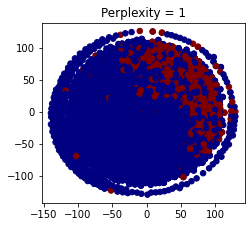

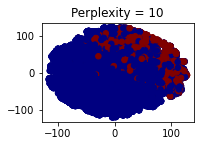

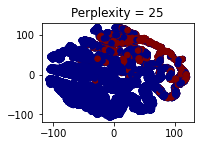

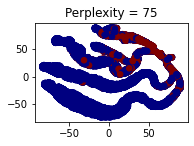

In [194]:
plt.figure(figsize = (8,4))
plt.subplots_adjust(top = 1.5) 
for index, p in enumerate([1, 10, 25, 75]):
    tsne = TSNE(n_components = 2, perplexity = p, random_state=0)
    tsne_results = tsne.fit_transform(X) 
    tsne_results=pd.DataFrame(tsne_results, columns=['tsne1', 'tsne2']) 
    plt.subplot(2,2,index+1)
    plt.scatter(tsne_results['tsne1'], tsne_results['tsne2'], c=df['y'], s=30,cmap='jet')
    plt.title('Perplexity = '+ str(p))
    plt.show()

# There is a imbalance in the target variable. Red values are only 12,5%. of the total target data. 

In [195]:
#blues are more because there are much more blue values. 
df['y'].value_counts()

0    18610
1     2671
Name: y, dtype: int64

In [55]:
df = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/Unsupervised learning/Dimensionality reduction/Train_Bank_dataset.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28831 entries, 0 to 28830
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             28831 non-null  int64  
 1   job             28831 non-null  object 
 2   marital         28831 non-null  object 
 3   education       28831 non-null  object 
 4   default         28831 non-null  object 
 5   housing         28831 non-null  object 
 6   loan            28831 non-null  object 
 7   contact         28831 non-null  object 
 8   month           28831 non-null  object 
 9   day_of_week     28831 non-null  object 
 10  duration        28831 non-null  int64  
 11  campaign        28831 non-null  int64  
 12  pdays           28831 non-null  int64  
 13  previous        28831 non-null  int64  
 14  poutcome        28831 non-null  object 
 15  emp.var.rate    28831 non-null  float64
 16  cons.price.idx  28831 non-null  float64
 17  cons.conf.idx   28831 non-null 

In [58]:
from sklearn.preprocessing import LabelEncoder

In [59]:
#perform label encoding on col1, col2 columns
df[['job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week','poutcome']] = df[['job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week','poutcome']].apply(LabelEncoder().fit_transform)

In [60]:
df.head(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,50,1,2,0,0,0,0,1,6,2,...,2,999,0,1,1.1,93.994,-36.4,4.860,5191.0,no
1,51,7,1,5,1,0,0,1,6,1,...,5,999,0,1,1.1,93.994,-36.4,4.858,5191.0,no
2,46,9,0,5,0,2,0,0,6,1,...,2,999,0,1,-1.8,92.893,-46.2,1.244,5099.1,no
3,46,0,2,6,0,2,0,1,4,1,...,1,999,0,1,1.4,94.465,-41.8,4.961,5228.1,no
4,25,7,2,3,0,0,0,0,6,2,...,5,999,0,1,-1.8,92.893,-46.2,1.266,5099.1,yes


In [61]:
X = df.drop('y', axis=1)
y = df['y']

In [62]:
# Configure t-SNE function. 
TSNE_bank_dataset = TSNE(
    n_components=3, # default=2, Dimension of the embedded space.
    perplexity=40, # default=30.0, The perplexity is related to the number of nearest neighbors that is used in other manifold learning algorithms.
    early_exaggeration=12, # default=12.0, Controls how tight natural clusters in the original space are in the embedded space and how much space will be between them. 
    learning_rate=200, # default=200.0, The learning rate for t-SNE is usually in the range [10.0, 1000.0]. If the learning rate is too high, the data may look like a ‘ball’ with any point approximately equidistant from its nearest neighbours. If the learning rate is too low, most points may look compressed in a dense cloud with few outliers.
    n_iter=1000, # default=1000, Maximum number of iterations for the optimization. Should be at least 250.
    n_iter_without_progress=300, # default=300, Maximum number of iterations without progress before we abort the optimization, used after 250 initial iterations with early exaggeration. 
    min_grad_norm=0.0000001, # default=1e-7, If the gradient norm is below this threshold, the optimization will be stopped.
    metric='euclidean', # default=’euclidean’, The metric to use when calculating distance between instances in a feature array.
    init='random', # {‘random’, ‘pca’} or ndarray of shape (n_samples, n_components), default=’random’. Initialization of embedding
    verbose=0, # default=0, Verbosity level.
    random_state=42, # RandomState instance or None, default=None. Determines the random number generator. Pass an int for reproducible results across multiple function calls.
    method='barnes_hut', # default=’barnes_hut’. By default the gradient calculation algorithm uses Barnes-Hut approximation running in O(NlogN) time. method=’exact’ will run on the slower, but exact, algorithm in O(N^2) time. The exact algorithm should be used when nearest-neighbor errors need to be better than 3%. 
    angle=0.5, # default=0.5, Only used if method=’barnes_hut’ This is the trade-off between speed and accuracy for Barnes-Hut T-SNE.
    n_jobs=-1, # default=None, The number of parallel jobs to run for neighbors search. -1 means using all processors. 
)

In [63]:
reduce_dataset = TSNE_bank_dataset.fit_transform(X)

In [64]:
reduce_dataset.shape

(28831, 3)

In [199]:
import plotly.express as px # for data visualization

In [65]:
df[['TSNE1','TSNE2','TSNE3']] = reduce_dataset 

In [69]:
fig = px.scatter_3d(df,x='TSNE1',y='TSNE2',z='TSNE3',color='y')
fig.show()

There is an imbalance in the target variable. Red values are only 12,5%. of the total target data.

In [68]:
df['y'].value_counts()

no     25583
yes     3248
Name: y, dtype: int64

In [67]:
fig = px.scatter_3d(df,x='TSNE1',y='TSNE2',z='TSNE3',color='marital')
fig.show()

There is an imbalance in the target variable. Red values are only 12,5%. of the total target data.